# CRF sequence tagging for Move Queries

In [126]:
import os
import sys

from copy import deepcopy
from collections import Counter
from nltk.tag import CRFTagger
from nltk.tokenize import word_tokenize

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import classification_report

from matplotlib import pyplot as plt
import numpy as np

import re
import unicodedata
import nltk

nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ADMIN\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\ADMIN\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [127]:
def get_raw_data_from_bio_file(fpath):
    """A simple function to read in from a one-word-per-line BIO
    (Beginning, Inside, Outside) tagged corpus, tab separated
    and each example sentence/text separated with a blank line.
    The data is already tokenized in a simple way.
    e.g.:                     
    
    O	a
    O	great
    O	lunch
    O	spot
    O	but
    B-Hours	open
    I-Hours	till
    I-Hours	2
    I-Hours	a
    I-Hours	m
    B-Restaurant_Name	passims
    I-Restaurant_Name	kitchen
    
    returns a list of lists of tuples of (word, tag) tuples
    """
    f = open(fpath)
    data = []  # the data, a list of lists of (word, tag) tuples
    current_sent = []  # data for current sentence/example
    for line in f:
        if line == "\n":  # each instance has a blank line separating it from next one
            # solution
            data.append(current_sent)
            current_sent = []
            continue
        line_data = line.strip("\n").split("\t")
        current_sent.append((line_data[1], line_data[0]))
    f.close()
    return data

In [128]:
raw_training_data = get_raw_data_from_bio_file("engtrain.bio.txt") 

In [129]:
# have a look at the first example
print(raw_training_data[0])

[('what', 'O'), ('movies', 'O'), ('star', 'O'), ('bruce', 'B-ACTOR'), ('willis', 'I-ACTOR')]


In [130]:
print(len(raw_training_data), "instances")
print(sum([len(sent) for sent in raw_training_data]), "words")

9775 instances
99491 words


In [ ]:
# define the function of preProcess and adjusting as tokenisation

In [131]:
def preProcess(example):
    """Function takes in list of (word, bio-tag) pairs, e.g.:
        [('what', 'O'), ('movies', 'O'), ('star', 'O'), ('bruce', 'B-ACTOR'), ('willis', 'I-ACTOR')]
    returns new (token, bio-tag) pairs with preprocessing applied to the words"""
       
        # a postagger for use in exercises
    posttagger = CRFTagger()
    posttagger.set_model_file("crf_pos.tagger")
    # example use:
    words = ["john", "likes", "mary", "and", "bill"]
   #print(posttagger.tag(words))
        # word tokenisation and POS tagging
    
    new_tokens = []
    for i in example:
           Li = list(i) #change the type of data to list
           Li[0] = word_tokenize(i[0]) # tokenize the data
           
           try:
              [(a,b,)] = posttagger.tag(Li[0]) # use CRFTagger() function, which has been trained before, and store the result in a ,b
           except ValueError:
              pass
            
           
           Li[0] = a + '!' + b # create the dat which is "word!POS_tagging"
          
           i = tuple(Li) # change the data type back to tuple
           new_tokens.append(i) # add the data in new_tokens
    
    
    preprocessed_example = new_tokens  
    
    return preprocessed_example

In [132]:
training_data = [preProcess(example) for example in raw_training_data]

In [133]:
# check the effect of pre-processing
print(training_data[0])

[('what!WP', 'O'), ('movies!NNS', 'O'), ('star!NN', 'O'), ('bruce!NN', 'B-ACTOR'), ('willis!NNPPOS', 'I-ACTOR')]


In [134]:
_pattern = re.compile(r"\d")  # to recognize numbers/digits

# This is the 'out-of-the-box' get_features function from the nltk CRF tagger
def get_features(tokens, idx):
    """
    Extract basic features about this word including
         - Current Word
         - Is Capitalized ?
         - Has Punctuation ?
         - Has Number ?
         - Suffixes up to length 3
    Note that : we might include feature over previous word, next word ect.

    :return : a list which contains the features
    :rtype : list(str)

    """
    token = tokens[idx]
    feature_list = []

    if not token:
        return feature_list

    # Capitalization
    if token[0].isupper():
        feature_list.append("CAPITALIZATION")

    # Number
    if re.search(_pattern, token) is not None:
        feature_list.append("HAS_NUM")

    # Punctuation
    punc_cat = set(["Pc", "Pd", "Ps", "Pe", "Pi", "Pf", "Po"])
    if all(unicodedata.category(x) in punc_cat for x in token):
        feature_list.append("PUNCTUATION")

    # Suffix up to length 3
    if len(token) > 1:
        feature_list.append("SUF_" + token[-1:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[-2:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[-3:])
    
    # Split the special character
    token_split_word = token.split('!') #split the word with special character and get the word & POS tag
    token = token_split_word[0] # store the word in token
        
    feature_list.append("WORD_" + token)
    feature_list.append("POS_" + token_split_word[1]) # add POS tagging
    print(feature_list)
    return feature_list


In [135]:
#pip install python-crfsuite

In [136]:
# Train the CRF BIO-tag tagger
TAGGER_PATH = "crf_nlu.tagger"  # path to the tagger- it will save/access the model from here
ct = CRFTagger(feature_func=get_features)  # initialize tagger with get_features function

print("training tagger...")
ct.train(training_data, TAGGER_PATH)
print("done")

training tagger...
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_star', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_bruce', 'POS_NN']
['SUF_S', 'SUF_OS', 'SUF_POS', 'WORD_willis', 'POS_NNPPOS']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_films', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_drew', 'POS_VBD']
['SUF_R', 'SUF_BR', 'SUF_RBR', 'WORD_barrymore', 'POS_RBR']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_1980s', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_starred', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!

['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_drama', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_america', 'POS_NNP']
['SUF_W', 'SUF_FW', 'SUF_!FW', 'WORD_fererra', 'POS_FW']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_susan', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_sarandon', 'POS_NN']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_jenna', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_elfman', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_

['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_julie', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_andrews', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_1960s', 'POS_NNS']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_names', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_best', 'POS_JJS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_reviewed', 'POS_VBN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_based', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_on', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_books', 'POS_NNS']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_can', 'POS_MD']
['S

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_appeared', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_had', 'POS_VBD']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_peter', 'POS_JJR']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_parker', 'POS_JJR']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_as', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_superhero', 'POS_CD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_it', 'POS_PRP']
['SUF_S', 'SUF_BS', 'SUF_RBS', 'WORD_ghost', 'POS_RBS']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_rider', 'POS_JJR']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2', 'POS_CD']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_P', 

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_hills', 'POS_NNS']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_have', 'POS_VBP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_eyes', 'POS_NNS']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_want', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_horror', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_where', 'POS_WRB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_bad', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_guy', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS',

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_based', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_on', 'POS_IN']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_stephen', 'POS_WRB']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_king', 'POS_VBG']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_books', 'POS_NNS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_johnny', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_depp', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_made', 'POS_VBN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_1980s', 'POS_NNS']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_N', '

['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_films', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_guns', 'POS_NNS']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_have', 'POS_VBP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_witches', 'POS_NNS']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_trying', 'POS_VBG']
['SUF_O', 'SUF_TO', 'SUF_!TO', 'WORD_to', 'POS_TO']
['SUF_H', 'SUF_U

['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_jennifer', 'POS_JJR']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_aniston', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_1990s', 'POS_NNS']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_rob', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_marshall', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_direct', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_set', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_japan', 'POS_NNP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_policeman', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_godfather', 'POS_JJR']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_main', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_celebrity', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_voices', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_monsters', 'POS_NNS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_inc', 'POS_NN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_documentary', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_musical', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_clint', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_eastwood', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_song', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_rock', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_hula', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_it', 'POS_PRP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'W

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_dillon', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_drug', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_use', 'POS_VB']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_merican', 'POS_JJ']
['SUF_B', 'SUF_RB', 'SUF_PRB', 'WORD_president', 'POS_VBPRB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_jessica', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_alba', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_make', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_N', 

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_theme', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_song', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_pirates', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_carribean', 'POS_VB']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_

['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_he', 'POS_PRP']
['SUF_B', 'SUF_RB', 'SUF_DRB', 'WORD_cant', 'POS_MDRB']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_refuse', 'POS_RB']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_play', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_trailer', 'POS_JJR']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_saving', 'POS_VBG']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_private', 'POS_JJ']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_ryan', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_ronald', 'POS_VBN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_regan', 'POS_NNP']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF

['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_am', 'POS_VBP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_looking', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_court', 'POS_NN']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_or', 'POS_CC']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_legal', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_theme', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_1990s', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_$', 'SUF_P$', 'SUF_RP$', 'WORD_my', 'POS_PRP$']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_cousin', 'POS_NN']
['SUF_J',

['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_george', 'POS_VB']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_romeros', 'POS_NNS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_direcorial', 'POS_JJ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_debut', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_all', 'POS_DT']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_oscar', 'POS_NNP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_winning', 'POS_VBG']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_spielberg', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_person', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_sings', 'POS_NNS']
[

['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_austin', 'POS_NNP']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_power', 'POS_JJR']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_how', 'POS_WRB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_many', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_had', 'POS_VBD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_woody', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_allen', 'POS_VBN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', '

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_benetar', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_john', 'POS_NNP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_q', 'POS_NNP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1967', 'POS_CD']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_drama', 'POS_NNP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_faye', 'POS_UH']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_dunaway', 'POS_RB']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_starred', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF

['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_as', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_prostitute', 'POS_VB']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_first', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_star', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_trek', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_genre', 'POS_PRPVBP']
['SUF_Z', 'SUF_BZ', 'SUF_V

['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_moves', 'POS_VBZ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_nc', 'POS_JJ']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_17', 'POS_CD']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_which', 'POS_WDT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_like', 'POS_UH']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_king', 'POS_VBG']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_kong', 'POS_JJ']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_but', 'POS_CC']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_gorrilla', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_named', 'POS_VBN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_joe', 'POS_NNP']
['SUF_P', 

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_star', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_wars', 'POS_NNS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_science', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_fiction', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1965', 'POS_CD']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_animation', 'POS_NN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_character', 'POS_JJR']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_antonio', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_banderas', 'POS_NNS']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_play

['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_thr', 'POS_CC']
['SUF_R', 'SUF_BR', 'SUF_RBR', 'WORD_princess', 'POS_RBR']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_frog', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_animated', 'POS_VBN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_disney', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_1990s', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_shirley', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_temples', 'POS_NNS

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_daniel', 'POS_NN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_craig', 'POS_JJ']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_character', 'POS_JJR']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_does', 'POS_VBZ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_arnold', 'POS_VBN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_schwarzenegger', 'POS_JJR']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_play', 'POS_VB']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_kindergarten', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_cop', 'POS_NN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_want', 'POS_VB']
['SUF_O', 'SUF_TO', 'SUF_!TO', 'WORD_to', 'POS_TO']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_see', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_action', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_romance', 'POS_NN']
[

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_animated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_classic', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_life', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_al', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_jolson', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_song', 'POS_JJ']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_played', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_at', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_B', 'SUF_VB', 'SUF

['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2002', 'POS_CD']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_brad', 'POS_VBN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_pitt', 'POS_VBN']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_when', 'POS_WRB']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_lord', 'POS_UH']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_rings', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_made', 'POS_VBN']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_whats', 'POS_WPBES']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_mexican', 'POS_JJ']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_john', 'POS_NNP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_huston', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['

['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_carter', 'POS_JJR']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_looking', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_mel', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_gibson', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_B', 'SUF_RB', 'SUF_PRB', 'WORD_ancient', 'POS_VBPRB']
['SUF_S', 'SUF_PS', 'SUF_NPS', 'WORD_indians', 'POS_NNPS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_mexico', 'POS_NNP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_latin', 'POS_JJ']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_america', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_revolutions', 'P

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_william', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_holden', 'POS_VBN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_set', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_german', 'POS_NNP']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_pow', 'POS_WRB']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_camp', 'POS_VB']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_billy', 'POS_RB']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_wilder', 'POS_JJR']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_jack', 'POS_NNP']
['SUF_J', 'SUF_JJ',

['SUF_D', 'SUF_MD', 'SUF_PMD', 'WORD_ferrell', 'POS_PRPMD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_drew', 'POS_VBD']
['SUF_R', 'SUF_BR', 'SUF_RBR', 'WORD_barrymore', 'POS_RBR']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_alien', 'POS_VBN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_song', 'POS_JJ']
['SUF_T', 'SUF_DT', '

['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_aside', 'POS_RB']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_harry', 'POS_VB']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_potter', 'POS_JJR']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_on', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_horror', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_daniel', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_radcliffe', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_stars', 'POS_NNS']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_quentin', 'POS_NN']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_tarantino', 'POS_RB']
['SUF

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_this', 'POS_DT']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_genre', 'POS_PRPVBP']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_which', 'POS_WDT']
['SUF_S', 'SUF_BS', 'SUF_RBS', 'WORD_post', 'POS_RBS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_apocalyptic', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_horror', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_sequel', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_28', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_days', 'POS_NNS']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_later', 'POS_RB']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_crazy', 'POS_JJ']


['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_comedy', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_1990s', 'POS_NNS']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_jim', 'POS_NNP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_carrey', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_top', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_romantic', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_comedies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_past', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_ten', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_years', 'POS_NNS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']

['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_bear', 'POS_VB']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_based', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_on', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_martin', 'POS_NN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_luther', 'POS_JJR']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_king', 'POS_VBG']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_won', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_P', 'SUF_NP', '

['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_gooding', 'POS_VBG']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_jr', 'POS_CC']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_tom', 'POS_NNP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_cruise', 'POS_VB']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_oliver', 'POS_JJR']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_stone', 'POS_VBN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 

['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_two', 'POS_CD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_us', 'POS_PRP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_will', 'POS_MD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_smith', 'POS_IN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_five', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_star', 'POS_NN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_viewer', 'POS_JJR']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT

['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_which', 'POS_WDT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_cowboy', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_had', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_song', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_wanderin', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_star', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_it', 'POS_PRP']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_joss', 'POS_VBZ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_whedon', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_write', 'POS_VB']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_or', 'POS_CC']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_direct', 'POS_VB']
['SUF_B', 'SUF_

['SUF_W', 'SUF_FW', 'SUF_!FW', 'WORD_zebra', 'POS_FW']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_im', 'POS_PRPVBP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_looking', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_steven', 'POS_CD']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_spielberg', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_made', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2008', 'POS_CD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_highly', 'POS_RB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_recommended', 'POS_VBN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_drama', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'P

['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_also', 'POS_RB']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_star', 'POS_NN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_jeremy', 'POS_JJ']
['SUF_R', 'SUF_BR', 'SUF_RBR', 'WORD_renner', 'POS_RBR']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_how', 'POS_WRB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_many', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_woody', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_allen', 'POS_VBN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_carmen', 'POS_NNS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_electra', 'POS_JJ']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_B', 

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_planet', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_during', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_years', 'POS_NNS']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_fritz', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_lang', 'POS_VB']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_direct', 'POS_VB']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_where', 'POS_WRB']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_do', 'POS_VBP']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_review', 'POS_VBD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_B', 'SUF_VB

['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_supporting', 'POS_VBG']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_role', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_trailer', 'POS_JJR']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_peter', 'POS_JJR']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_ustinov', 'POS_NNP']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_flick', 'POS_JJ']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_next', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_big', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_marvel', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_G', 'SUF_BG

['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_all', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_westerns', 'POS_NNS']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_pretty', 'POS_RB']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_much', 'POS_RB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_versus', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_evil', 'POS_JJ']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_family', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SU

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_mental', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_hospital', 'POS_JJ']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_must', 'POS_MD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_see', 'POS_VB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_unrated', 'POS_VBN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_disney', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_made', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_within', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_seven', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_years', 'POS_NNS']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_X', '

['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_can', 'POS_MD']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_suggest', 'POS_JJS']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_crime', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_can', 'POS_MD']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_suggest', 'POS_JJS']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_horror', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_B', 'SUF_VB', 'SUF_!

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_director', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_david', 'POS_VBN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_presley', 'POS_NNP']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_have', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_ratings', 'POS_NNS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_average', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_highly', 'POS_RB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_recommended', 'POS_VBN']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_could', 'POS_MD']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_tell', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_where', 'POS_WRB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_might', 'POS_MD']
['S

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_war', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_government', 'POS_NN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_assassin', 'POS_NNP']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1980', 'POS_CD']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_jack', 'POS_NNP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_gold', 'POS_VBN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_direct', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_really', 'POS_RB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_family', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SU

['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_godfather', 'POS_JJR']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_spencer', 'POS_JJR']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_tracy', 'POS_NN']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_ever', 'POS_RB']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_act', 'POS_VBP']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantasy', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_spencer', 'POS_JJR']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_tracy', 'POS_NN']
['SUF_B', 'SUF_R

['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_listing', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_thriller', 'POS_JJR']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS_CD']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_do', 'POS_VBP']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_have', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_title', 'POS_JJ']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_which', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_made', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_N'

['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_do', 'POS_VBP']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_have', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_short', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1970', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_kenneth', 'POS_NNS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_branagh', 'POS_JJ']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_do', 'POS_VBP']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_have', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_six', 'POS_CD']
['SUF_N', 

['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_girls', 'POS_NNS']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_easy', 'POS_JJ']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_helen', 'POS_VBN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_hunt', 'POS_VB']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1960', 'POS_CD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_six', 'POS_CD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_nic', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_izzi', 'POS_NNS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_russian', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_war', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_eight', 'POS_CD']
['SUF_

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_move', 'POS_VB']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_andrea', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_thompson', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_mass', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_destruction', 'POS_NN']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_thats', 'POS_DTBES']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_really', 'POS_RB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_robert', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_picardo', 'POS_VB']
['SU

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_starred', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_biography', 'POS_WRB']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_federico', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_fellini', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_romantic', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_comedy', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_films', 'POS_NNS']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_federico', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_felli

['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_samuel', 'POS_NN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_l', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_jackson', 'POS_NN']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_ever', 'POS_RB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_been', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_adventure', 'POS_PRPVBP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_highly', 'POS_RB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_sarah', 'POS_UH']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_michelle', 'POS_NNP']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_gellar', 'POS_JJ']
['SUF_

['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_how', 'POS_WRB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_many', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_nc', 'POS_JJ']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_17', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_dealt', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_terror', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_eight', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_decades', 'POS_NNS']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_how', 'POS_WRB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_many', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_D', '

['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_highly', 'POS_RB']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_liked', 'POS_VBD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_viewers', 'POS_NNS']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_am', 'POS_VBP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_looking', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_nc', 'POS_JJ']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_17', 'POS_CD']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_political', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_based', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_on', 'POS_IN']
['SUF_N', 

['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2081', 'POS_CD']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_want', 'POS_VB']
['SUF_R', 'SUF_BR', 'SUF_RBR', 'WORD_more', 'POS_RBR']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_information', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantastic', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_voyage', 'POS_NN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_want', 'POS_VB']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_really', 'POS_RB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_popular', 'POS_JJ']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1960', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_women', 'POS_NNS']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_films'

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_cia', 'POS_NNP']
['SUF_B', 'SUF_RB', 'SUF_PRB', 'WORD_agent', 'POS_VBPRB']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_decade', 'POS_VBN']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_liked', 'POS_VBD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_many', 'POS_JJ']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_would', 'POS_MD']
['SUF_H', 'SUF_UH', 'SUF_!UH

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_desert', 'POS_NN']
['SUF_S', 'SUF_PS', 'SUF_NPS', 'WORD_fox', 'POS_NNPS']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_story', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_rommel', 'POS_NN']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_im', 'POS_PRPVBP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_looking', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1990', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_william', 'POS_NN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_lustig', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_imagination', 'POS_NN']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_im', 'POS_PRPVBP']

['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_south', 'POS_RB']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_america', 'POS_NNP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_michael', 'POS_NNP']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_lander', 'POS_JJR']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_im', 'POS_PRPVBP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_looking', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS_CD']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_steve', 'POS_PRPVBP']
['SUF_W', 'SUF_FW', 'SUF_!FW', 'WORD_marra', 'POS_FW']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_soldiers', 'POS_NNS']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_im', 'POS_PRPVBP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_l

['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_action', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_double', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_identity', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2000', 'POS_CD']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_romance', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_which', 'POS_WDT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_held', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_ratings', 'POS_NNS']

['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_western', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_past', 'POS_JJ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_decade', 'POS_VBN']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_how', 'POS_WRB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_many', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_R', 'SUF_BR', 'SUF_RBR', 'WORD_wilderness', 'POS_RBR']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_received', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_mediocre', 'POS_PRPVBP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['S

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_science', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_fiction', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_excellent', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_ratings', 'POS_NNS']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_mel', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_gibson', 'POS_NN']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_new', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2012', 'POS_CD']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['S

['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_gina', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_gershon', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1970', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_highly', 'POS_RB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_biography', 'POS_WRB']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_form', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_18', 'POS_CD']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_th', 'POS_UH']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_century', 'POS_NN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_heather', 'POS_JJR']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_graham', 'POS_NNP']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_western',

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_director', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_ingmar', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_bergman', 'POS_NN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_like', 'POS_UH']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_love', 'POS_VBP']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_man', 'POS_UH']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_like', 'POS_UH']
['SUF_N', 'SUF_NN', 'SUF_!N

['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_wall', 'POS_NN']
['SUF_M', 'SUF_YM', 'SUF_SYM', 'WORD_e', 'POS_SYM']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_which', 'POS_WDT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_director', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_oliver', 'POS_JJR']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_stone', 'POS_VBN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_love', 'POS_VBP']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_at', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SU

['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_really', 'POS_RB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_drama', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS_CD']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_really', 'POS_RB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_romance', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_roxann', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_dawson', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SU

['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_ten', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_years', 'POS_NNS']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_western', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_sissy', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_spacek', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_it', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_N', 'SUF_IN',

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_fiction', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_had', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_plot', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_line', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_parasites', 'POS_NNS']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_had', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_actor', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_tyrone', 'POS_VBN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_burton', 'POS_NNP']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_liked', 'POS_VBD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_many', 'POS_JJ']
['SUF_Z', '

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_crime', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1980', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_g', 'POS_NNP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_mystery', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_past', 'POS_JJ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_decade', 'POS_VBN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N'

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_five', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_stars', 'POS_NNS']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_madonna', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_noir', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_within', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_past', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_four', 'POS_CD']
['SUF_N', 'SUF_NN', 

['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1980', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_director', 'POS_NN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_bob', 'POS_NNP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_byington', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_horror', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_during', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1990', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['S

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_all', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantasy', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_all', 'POS_DT']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_right', 'POS_UH']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_all', 'POS_DT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_g', 'POS_NNP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_westerns', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_seven', 'POS_CD']
['SUF_S', 'SUF_NS',

['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_oliver', 'POS_JJR']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_stone', 'POS_VBN']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_made', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2000', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_adventure', 'POS_PRPVBP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_ok', 'POS_VB']
['SUF

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_plot', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_babylon', 'POS_NN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_central', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_plot', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_believers', 'POS_NNS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_plot', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'S

['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_two', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_decades', 'POS_NNS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_action', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_edward', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_lachman', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_given', 'POS_VBN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_two', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_thumbs', 'POS_NNS']
['SUF_P', 'SUF_RP', 'SUF_!RP', 'WORD_up', 'POS_RP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_J

['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_please', 'POS_VB']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_some', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantasy', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_films', 'POS_NNS']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_angelina', 'POS_NNP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_jolie', 'POS_NNP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_worked', 'POS_VBD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_please', 'POS_VB']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_some', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantasy', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_please', 'POS_VB']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_diana', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_rigg', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_starred', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_past', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_five', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_years', 'POS_NNS']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_ago', 'POS_RB']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_very', 'POS_RB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_trailer', 'POS_JJR']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_N', 'SUF_BN'

['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_g', 'POS_NNP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_mystery', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_jeremy', 'POS_JJ']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_london', 'POS_NNP']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_ever', 'POS_RB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_featured', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_documentary', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1950', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_D', '

['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_all', 'POS_DT']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_right', 'POS_UH']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_child', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_approved', 'POS_VBN']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_had', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_meerkat', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN

['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_ratings', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_mockumentary', 'POS_JJ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_starred', 'POS_VBN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_gary', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_oldman', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_thriller', 'POS_JJR']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_liked', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_lot'

['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_comedy', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1940', 'POS_CD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_got', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_average', 'POS_JJ']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_six', 'POS_CD']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_family', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', '

['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_past', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_action', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_gerard', 'POS_VBN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_depardieu', 'POS_PRP']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_terrorist', 'POS_JJS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_action', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_lea', 'POS_NN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_solunga', 'POS_NN

['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_undercover', 'POS_JJR']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_police', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_some', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2000', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_gabby', 'POS_NN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_hoffman', 'POS_NNP']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_some', 'PO

['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_titles', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_kirstie', 'POS_VB']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_alley', 'POS_NNP']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1980', 'POS_CD']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_titles', 'POS_NNS']
['SU

['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantasy', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_S', 'SUF_OS', 'SUF_POS', 'WORD_tomas', 'POS_NNPPOS']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_sandquist', 'POS_JJS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_decade', 'POS_VBN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_had', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_average', 'POS_JJ']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_eight', 'POS_CD']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_J

['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_peter', 'POS_JJR']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_webber', 'POS_JJR']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_all', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_american', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_orgy', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_justice', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_all', 'POS_DT']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_becoming', 'POS_VBG']
['SUF_B', 'SUF_V

['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1940', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_activism', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_adam', 'POS_NNP']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_barnick', 'POS_JJ']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
[

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_noir', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_made', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_within', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_decade', 'POS_VBN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_sport', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VB

['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_animal', 'POS_JJ']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_abuse', 'POS_RB']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_given', 'POS_VBN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_four', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_stars', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_seven', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_years', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_horror', 'POS_JJ']
['SUF_N', 'SUF_NN', 'S

['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_clint', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_eastwood', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_really', 'POS_RB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_popular', 'POS_JJ']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1950', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_computer', 'POS_NN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_hacker', 'POS_JJR']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'P

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_best', 'POS_JJS']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_drama', 'POS_NNP']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_came', 'POS_VBD']
['SUF_P', 'SUF_RP', 'SUF_!RP', 'WORD_out', 'POS_RP']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2000', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_best', 'POS_JJS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantasy', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_all', 'POS_DT']
['SUF_N', 'SUF_NN',

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_B', 'SUF_RB', 'SUF_DRB', 'WORD_confidant', 'POS_MDRB']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_shining', 'POS_VBG']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_spirit', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT',

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_steven', 'POS_CD']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_spielberg', 'POS_NNP']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_western', 'POS_JJ']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_christian', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_bale', 'POS_JJ']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_several', 'POS_JJ']
['SUF_S', '

['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_title', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_ralph', 'POS_UH']
['SUF_M', 'SUF_YM', 'SUF_SYM', 'WORD_e', 'POS_SYM']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_portillo', 'POS_UH']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_R', 'SUF_BR', 'SUF_RBR', 'WORD_prisoner', 'POS_RBR']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT'

['SUF_P', 'SUF_RP', 'SUF_!RP', 'WORD_out', 'POS_RP']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_seven', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_years', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_orson', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_welles', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_N', 

['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_well', 'POS_UH']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_sci', 'POS_NNS']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_fi', 'POS_NNS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_kirsten', 'POS_VBN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_sheridan', 'POS_NNP']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_as', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_director', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_demons', 'POS_NNS']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2', 'POS_CD']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_receive', 'POS_CD']
['SU

['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2000', 'POS_CD']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_carl', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_t', 'POS_NN']
['SUF_S', 'SUF_PS', 'SUF_NPS', 'WORD_evans', 'POS_NNPS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_war', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_stars', 'POS_NNS']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_michael', 'POS_NNP']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_caine', 'POS_CD']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_war', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_sci', 'POS_NNS']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_fi', 'POS_NNS']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_g', 'POS_NNP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_drew', 'POS_VBD']
['SUF_S', 'SUF_OS', 'SUF_POS', 'WORD_rosas', 'POS_NNPPOS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2000', 'POS_CD']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_had', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_some', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_battle', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_it', 'POS_PRP']
['SUF_P'

['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_whats', 'POS_WPBES']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_unrated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_jason', 'POS_NN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_weaver', 'POS_JJR']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_musical', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1960', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_whats', 'POS_WPBES']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_unrated', 'POS_VBN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantasy', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']

['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1990', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_crime', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_fugitive', 'POS_CD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_plot', 'POS_VBN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_average', 'POS_JJ']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_nine', 'POS_CD']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_which', 'POS_WDT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS

['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_flypaper', 'POS_JJR']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_meet', 'POS_VB']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_market', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_longshots', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_else', 'POS_RB']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_terminator', 'POS_NN']
['HAS

['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_have', 'POS_VBP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_been', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_john', 'POS_NNP']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_wayne', 'POS_CD']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_would', 'POS_MD']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_have', 'POS_VBP']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_wanted', 'POS_VBD']
['SUF_O', 'SUF_TO', 'SUF_!TO', 'WORD_to', 'POS_TO']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_be', 'POS_VB']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_if', 'POS_IN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_he', 'POS_PRP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_were', 'POS_PRPVBP']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_still', 'POS_RB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_alive', 'POS_JJ']
['SUF_D', 'SUF_MD', 'SU

['SUF_R', 'SUF_BR', 'SUF_RBR', 'WORD_moore', 'POS_RBR']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1990', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_crime', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_g', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_P', 'SU

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_science', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_fiction', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_future', 'POS_NN']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_whats', 'POS_WPBES']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_scary', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_someone', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_power', 'POS_JJR']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_whats', 'POS_WPBES']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_spaghetti', 'POS_NNS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_western', 'POS_JJ']
['SU

['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_buzz', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_lightyear', 'POS_VB']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_mr', 'POS_CC']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_potato', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_head', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_it', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_which', 'POS_WDT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1960', 'POS_CD'

done


In [137]:
# load tagger from saved file
ct = CRFTagger(feature_func=get_features)  # initialize tagger
ct.set_model_file(TAGGER_PATH)  # load model from file

# prepare the test data:
raw_test_data = get_raw_data_from_bio_file("engtest.bio.txt") 
test_data = [preProcess(example) for example in raw_test_data]
print(len(test_data), "instances")
print(sum([len(sent) for sent in test_data]), "words")

2443 instances
24686 words


In [138]:
print("testing tagger...")
preds = []
y_test = []
for sent in test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
    preds.extend(sent_preds)
    y_test.extend(sent_true)
print("done")

testing tagger...
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_romantic', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_comedies', 'POS_NNS']
['SUF_P', 'SUF_RP', 'SUF_!RP', 'WORD_out', 'POS_RP']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_right', 'POS_UH']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_now', 'POS_RB']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_cars', 'POS_NNS']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_talk', 'POS_VB']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['

['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_marley', 'POS_NNP']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_song', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_down', 'POS_IN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_R', 'SUF_BR', 'SUF_RBR', 'WORD_sickness', 'POS_RBR']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_simon', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pegg', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_write', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_P', 'SUF_BP',

['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_christopher', 'POS_JJR']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_walkin', 'POS_VB']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_star', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_want', 'POS_VB']
['SUF_O', 'SUF_TO', 'SUF_!TO', 'WORD_to', 'POS_TO']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_comedies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_this', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!

['HAS_NUM', 'SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_1960s', 'POS_NNS']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_zombie', 'POS_NNP']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_flick', 'POS_JJ']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_how', 'POS_WRB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_many', 'POS_JJ']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_lord', 'POS_UH']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_rings', 'POS_NNS']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_films', 'POS_NNS']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_latest', 'POS_JJS']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_trailer', 'POS_JJR']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_bernard', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_herman', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_soundtrack', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_which', 'POS_WDT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_won', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_academy', 'POS_NNP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_award', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_best', 'POS_JJS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_picture', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2009', 'POS_CD']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP'

['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_see', 'POS_VB']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_review', 'POS_VBD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_black', 'POS_JJ']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_swan', 'POS_MD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_give', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_star', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_wars', 'POS_NNS']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'W

['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_hanks', 'POS_NNS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_features', 'POS_NNS']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_him', 'POS_PRP']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_as', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_stranded', 'POS_VBN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_fed', 'POS_VBN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_ex', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_employee', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_tell', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_plot', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_amistad', 'POS_VBN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_twister', 'POS_JJR']
['SUF_P',

['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_1980s', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_drive', 'POS_VB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_steve', 'POS_PRPVBP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_martins', 'POS_NNS']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_upcoming', 'POS_VBG']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_projects', 'POS_NNS']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_based', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_on', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_stephen', 'POS_WRB']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_king', 'POS_VBG']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_book', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_flu', 'POS_PRP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_killing', 'POS_VBG']
['SUF_S', 'SUF_BS', 'SUF_RBS', 'WORD_most', 'POS_RBS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_humanity', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_dean', 'POS_VB']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_koontz', 'POS_NNP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_direct', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1961', 'POS_CD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_harry', 'POS_VB']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_potter', 'POS_JJR']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_2000s', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_roger', 'POS_JJR']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_eberts', 'POS_NNS']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_best', 'POS_JJS']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_films', 'POS_NNS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', '

['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_sandler', 'POS_JJR']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_acted', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_which', 'POS_WDT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_actor', 'POS_NN']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_do', 'POS_VBP']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_prefer', 'POS_JJR']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_will', 'POS_MD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_smith', 'POS_IN']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_or', 'POS_CC']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_denzel', 'POS_NN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_washington', 'POS_NNP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_show', 'POS_VB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_me', 'POS_PRP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_cameron', 'POS_NN']
['SUF_H', 'S

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_this', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_adventure', 'POS_PRPVBP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_films', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_sofia', 'POS_NNP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_coppola', 'POS_NNP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_coming', 'POS_VBG']
['SUF_P', 'SUF_RP', 'SUF_!RP', 'WORD_out', 'POS_RP']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_soon', 'POS_RB']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
[

['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_ford', 'POS_NNP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_coppola', 'POS_NNP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_direct', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_thriller', 'POS_JJR']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1970', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_S', 'SUF_OS', 'SUF_POS', 'WORD_francois', 'POS_NNPPOS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_truffaut', 'POS_VBN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_direct', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_documentary', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_films', 'POS_NNS']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_frank',

['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1940', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_wych', 'POS_NN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_kaosayananda', 'POS_NNP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_do', 'POS_VBP']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_know', 'POS_VBP']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_where', 'POS_WRB']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_can', 'POS_MD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_S', 'SUF_PS', 'SUF_NPS', 'WORD_paradox', 'POS_NNPS']
['

['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_shining', 'POS_VBG']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_how', 'POS_WRB']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_like', 'POS_UH']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_4', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_months', 'POS_NNS']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_3', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_weeks', 'POS_NNS']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_days', 'POS_NNS']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_how', 'POS_WRB']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_like', 'POS_UH']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_men', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN

['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_im', 'POS_PRPVBP']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_looking', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_war', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_past', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_ten', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_years', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_nc', 'POS_JJ']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_17', 'POS_CD']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_putipong', 'POS_JJ']
['SUF_D', 'S

['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_mimi', 'POS_NNS']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_rogers', 'POS_NNS']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_many', 'POS_JJ']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_adventure', 'POS_PRPVBP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_films', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_past', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_seven', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_years', 'POS_NNS']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_been', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_horror', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_N',

['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_andrews', 'POS_NNS']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_excellent', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_ratings', 'POS_NNS']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_set', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1940', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_plot', 'POS_VBN']
['SUF_N', 'SU

['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_past', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_six', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_decades', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_darren', 'POS_NNS']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_stein', 'POS_VB']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_kid', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_growing', 'POS_VBG']
['SUF_P', 'SUF_RP', 'SUF_!RP', 'WORD_up', 'POS_RP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_list', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_move', 'POS_VB']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_sport', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_themed', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_S', 'SUF_OS', 'SUF_POS', 'WORD_chris', 'POS_NNPPOS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_nahon', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_everyone', 'POS_NN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_says', 'POS_VBZ']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_must', 'POS_MD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_see', 'POS_VB']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_comedy', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_N'

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_called', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_bronson', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_science', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_fiction', 'POS_NN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_very', 'POS_RB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_D', 'SUF_CD

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_john', 'POS_NNP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_geddes', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_some', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantasy', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_guy', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_magar', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_some', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_N', 'SUF_BN', '

['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_first', 'POS_JJ']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_20', 'POS_CD']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_million', 'POS_CD']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_always', 'POS_RB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_hardest', 'POS_JJS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_wall', 'POS_NN']
['SUF_M', 'SUF_YM', 'SUF_SYM', 'WORD_e', 'POS_SYM']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_welcome', 'POS_JJ']
['SUF_O', 'S

['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_best', 'POS_JJS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_romance', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_made', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_highest', 'POS_JJS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_charlie', 'POS_NNP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_chaplin', 'POS_VB']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['S

['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_$', 'SUF_P$', 'SUF_RP$', 'WORD_your', 'POS_PRP$']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_favorite', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_romance', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1980', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_$', 'SUF_P$', 'SUF_RP$', 'WORD_your', 'POS_PRP$']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_favorite', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_scary', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_ian', 'POS_MD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_david', 'POS_VBN']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_diaz', 'POS_UH']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_very', 'POS_RB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_popular', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_first', 'POS_JJ']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_love', 'POS_VBP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_lisa', 'POS_NNP']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_wolfinger', 'POS_JJR']
['SUF_N', 'SUF_

['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_when', 'POS_WRB']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_titled', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_b', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_girl', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_come', 'POS_VBN']
['SUF_P', 'SUF_RP', 'SUF_!RP', 'WORD_out', 'POS_RP']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_when', 'POS_WRB']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_see', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_must', 'POS_MD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_see', 'POS_VB']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_biography', 'POS_WRB']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 

['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_clark', 'POS_VB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_gable', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_romantic', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_comedy', 'POS_NN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_S', 'SUF_OS', 'SUF_POS', 'WORD_francis', 'POS_NNPPOS']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_ford', 'POS_NNP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_coppola', 'POS_NNP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_director', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_shining', 'POS_VBG']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_katharine', 'POS_CD']
['SUF_

In [139]:
# Output the classification report (which you should save each time for comparing your models)
print(classification_report(y_test, preds))

                   precision    recall  f1-score   support

          B-ACTOR       0.69      0.88      0.77       812
      B-CHARACTER       0.81      0.19      0.31        90
       B-DIRECTOR       0.81      0.57      0.66       456
          B-GENRE       0.92      0.95      0.93      1117
           B-PLOT       0.62      0.34      0.44       491
         B-RATING       0.98      0.97      0.97       500
B-RATINGS_AVERAGE       0.86      0.83      0.84       451
         B-REVIEW       0.25      0.02      0.03        56
           B-SONG       0.57      0.15      0.24        54
          B-TITLE       0.60      0.48      0.54       562
        B-TRAILER       0.80      0.80      0.80        30
           B-YEAR       0.93      0.94      0.94       720
          I-ACTOR       0.69      0.89      0.78       862
      I-CHARACTER       0.70      0.25      0.37        75
       I-DIRECTOR       0.82      0.56      0.66       496
          I-GENRE       0.83      0.70      0.76       

In [140]:
def confusion_matrix_heatmap(y_test, preds):
    """Function to plot a confusion matrix"""
    labels = list(set(y_test))   # get the labels in the y_test
    # print(labels)
    cm = confusion_matrix(y_test, preds, labels)
    fig = plt.figure(figsize=(20,20))
    ax = fig.add_subplot(111)
    cax = ax.matshow(cm)
    plt.title('Confusion matrix of the classifier')
    fig.colorbar(cax)
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels( labels, rotation=45)
    ax.set_yticklabels( labels)

    for i in range(len(cm)):
        for j in range(len(cm)):
            text = ax.text(j, i, cm[i, j],
                           ha="center", va="center", color="w")

    plt.xlabel('Predicted')
    plt.ylabel('True')
    #fig.tight_layout()
    plt.show()

C:\Users\ADMIN\anaconda3\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass labels=['B-TRAILER', 'I-RATINGS_AVERAGE', 'I-YEAR', 'O', 'I-GENRE', 'I-CHARACTER', 'I-PLOT', 'B-REVIEW', 'I-DIRECTOR', 'B-TITLE', 'B-ACTOR', 'B-RATINGS_AVERAGE', 'I-TITLE', 'I-SONG', 'B-RATING', 'I-RATING', 'B-PLOT', 'B-CHARACTER', 'I-REVIEW', 'B-GENRE', 'B-YEAR', 'I-ACTOR', 'I-TRAILER', 'B-SONG', 'B-DIRECTOR'] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


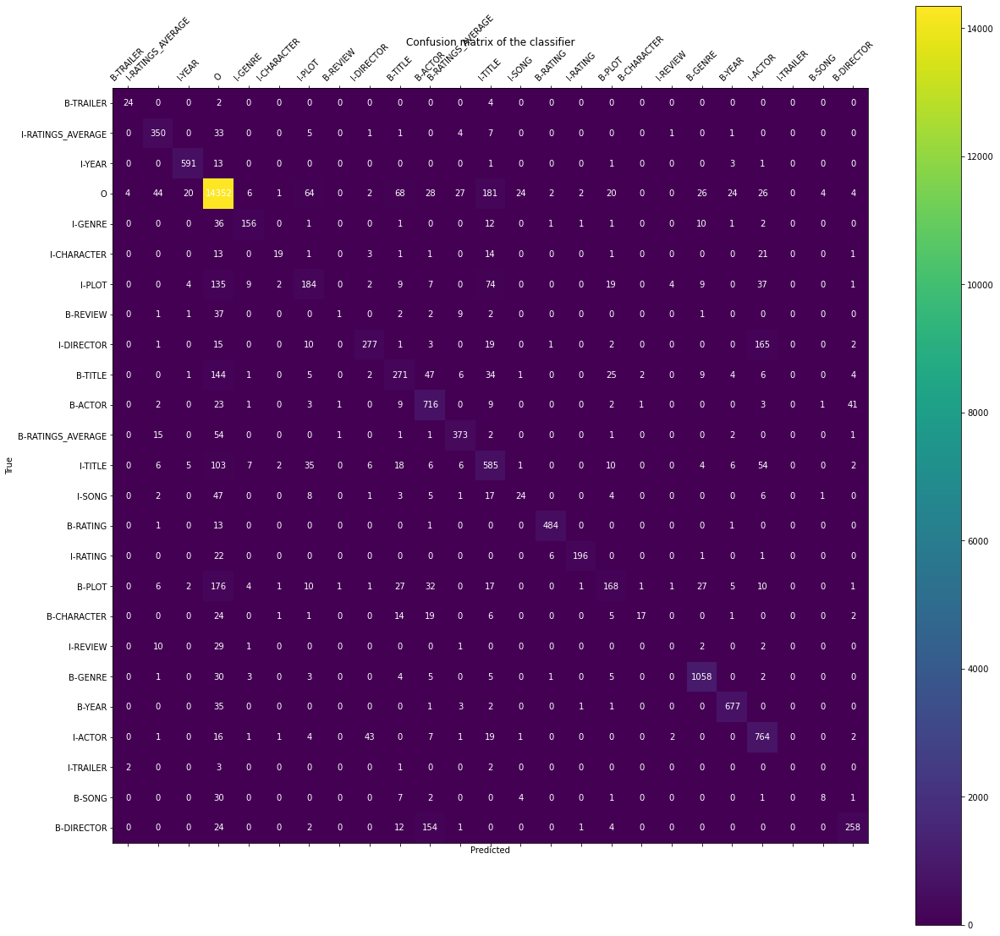

In [141]:
confusion_matrix_heatmap(y_test, preds)

# Using POS tags as features 
Use the CRF part-of-speech (POS) tagger as shown below to add POS tags to the words in the training data. Adjusting preProcess and observing the performance by using classification report  



In [142]:
# a postagger for use in exercises
posttagger = CRFTagger()
posttagger.set_model_file("crf_pos.tagger")
# example use:
words = ["john", "likes", "mary", "and", "bill"]
print(posttagger.tag(words))

[('john', 'NNP'), ('likes', 'VBZ'), ('mary', 'JJ'), ('and', 'CC'), ('bill', 'NN')]


In [143]:
def split_data(percentage):   # define the function that can split the data
    #percentage = 0.8
    data_sample = len(training_data) # find the length of training_data
    training_sample = int((percentage*data_sample)) # create the number of training data
    train_dataset = training_data[:training_sample] # create the list which store train_data
    test_dataset = training_data[training_sample:] # create the list which store test_data
    
    return train_dataset,test_dataset # return


split_data(0.8) # execute data which separate the data in 80% of training data and 20% of testing_data

([[('what!WP', 'O'),
   ('movies!NNS', 'O'),
   ('star!NN', 'O'),
   ('bruce!NN', 'B-ACTOR'),
   ('willis!NNPPOS', 'I-ACTOR')],
  [('show!VB', 'O'),
   ('me!PRP', 'O'),
   ('films!NNS', 'O'),
   ('with!IN', 'O'),
   ('drew!VBD', 'B-ACTOR'),
   ('barrymore!RBR', 'I-ACTOR'),
   ('from!IN', 'O'),
   ('the!DT', 'O'),
   ('1980s!NNS', 'B-YEAR')],
  [('what!WP', 'O'),
   ('movies!NNS', 'O'),
   ('starred!VBN', 'O'),
   ('both!DT', 'O'),
   ('al!NN', 'B-ACTOR'),
   ('pacino!RB', 'I-ACTOR'),
   ('and!CC', 'O'),
   ('robert!NN', 'B-ACTOR'),
   ('deniro!NNP', 'I-ACTOR')],
  [('find!VB', 'O'),
   ('me!PRP', 'O'),
   ('all!DT', 'O'),
   ('of!IN', 'O'),
   ('the!DT', 'O'),
   ('movies!NNS', 'O'),
   ('that!WDT', 'O'),
   ('starred!VBN', 'O'),
   ('harold!VBN', 'B-ACTOR'),
   ('ramis!NNPPOS', 'I-ACTOR'),
   ('and!CC', 'O'),
   ('bill!NN', 'B-ACTOR'),
   ('murray!VB', 'I-ACTOR')],
  [('find!VB', 'O'),
   ('me!PRP', 'O'),
   ('a!DT', 'O'),
   ('movie!NN', 'O'),
   ('with!IN', 'O'),
   ('a!DT', 'O'),
 

In [144]:
print("testing tagger...")
# we will train the data by using CRFTagger() ; look into preProcess and get_feature
predict_result = [] #create list
y_predict = []
sent_predict_result = []
sent_y_predict = []  
for i in test_dataset:

      # we use the previous code the train the data
      sent_predict_result = [k[1] for k in ct.tag([j[0] for j in i])] # we will tag the word(j) by using ct.tag() and store BIO- tag in sent_predict_result
      sent_y_predict = [j[1] for j in i] # we store all BIO-tag, which has one line, in sent_y_predict
      predict_result.extend(sent_predict_result) # add the data in predict_result 
      y_predict.extend(sent_y_predict) # add the data in y_predict    


print("done")

testing tagger...
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_five', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_star', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_thriller', 'POS_JJR']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_dover', 'POS_JJR']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_koshashvili', 'POS_NNS']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_unrated', 'POS_VBN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_five', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_star', 'POS_NN']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_did', 'POS_VBD']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_

['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_thriller', 'POS_JJR']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_matthew', 'POS_VBD']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_oneill', 'POS_MD']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1950', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantasy', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_dragons', 'POS_NNS']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_got', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'PO

['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_six', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_star', 'POS_NN']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_karen', 'POS_NNS']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_lynn', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_gorney', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_with', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SU

['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_highly', 'POS_RB']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_liked', 'POS_VBD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pg', 'POS_NN']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_13', 'POS_CD']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_horror', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_features', 'POS_NNS']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_charlton', 'POS_NNP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_heston', 'POS_NNP']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_historical', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']


['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_spaghetti', 'POS_NNS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_western', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_sport', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_ralph', 'POS_UH']
['SUF_S', 'SUF_OS', 'SUF_POS', 'WORD_thomas', 'POS_NNPPOS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_BN'

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_occult', 'POS_VBN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_unrated', 'POS_VBN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantasy', 'POS_JJ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_seven', 'POS_CD']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_unrated', 'POS_VBN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_horror', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_watchable', 'POS_JJ']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_S'

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_mel', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_brooks', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_highly', 'POS_RB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_thriller', 'POS_JJR']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_O', 'SUF_TO', 'SUF_!TO', 'WORD_to', 'POS_TO']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_come', 'POS_VBN']
['SUF_P', 'SUF_RP', 'SUF_!RP', 'WORD_out', 'POS_RP']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ

['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_has', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_plot', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_honor', 'POS_JJ']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_unrated', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_specific', 'POS_JJ']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_audiences', 'POS_NNS']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_nine', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_stars', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_got', 'POS_VBN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_five', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_stars', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_three', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_decades', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_bruce', 'POS_NN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_koehler', 'POS_JJR']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_western', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SU

['SUF_P', 'SUF_RP', 'SUF_!RP', 'WORD_out', 'POS_RP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_past', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_two', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_years', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_title', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_g', 'POS_NNP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_science', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_fiction', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ

['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_john', 'POS_NNP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_ford', 'POS_NNP']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_best', 'POS_JJS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_known', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_for', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_levar', 'POS_RB']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_burton', 'POS_NNP']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_during', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1950', 'POS_CD']
['SUF_S', 

['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_musical', 'POS_JJ']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_nathan', 'POS_IN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_lane', 'POS_CD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_got', 'POS_VBN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_average', 'POS_JJ']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_rating', 'POS_VBG']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_four', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_stars', 'POS_NNS']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_musical', 'POS_JJ']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_came', 'POS_VBD']
['SUF_P', 'SUF_RP', 'SUF_!RP', 'WORD_out', 'POS_RP']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'S

['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1960', 'POS_CD']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_spaghetti', 'POS_NNS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_western', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_guns', 'POS_NNS']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_would', 'POS_MD']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_you', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_recommend', 'POS_VB']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_spaghetti', 'POS_NNS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_western', 'POS_JJ']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_treasure', 'POS_PRPVBP']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_by', 'POS_IN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'W

['SUF_P', 'SUF_RP', 'SUF_!RP', 'WORD_out', 'POS_RP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_this', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_year', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_starred', 'POS_VBN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_michael', 'POS_NNP']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_douglas', 'POS_NNP']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_an', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_unwed', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_pregnancy', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_spaghetti', 'POS_NNS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_western', 'POS_JJ']
['SUF

['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_BS', 'SUF_RBS', 'WORD_most', 'POS_RBS']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_popular', 'POS_JJ']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_thriller', 'POS_JJR']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_1960', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_cypher', 'POS_JJR']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_about', 'POS_IN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_T', 

['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_guillermo', 'POS_RB']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_del', 'POS_NN']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_toro', 'POS_RB']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_whats', 'POS_WPBES']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_emotional', 'POS_JJ']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_drama', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_released', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_last', 'POS_JJ']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_eight', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_years', 'POS_NNS']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_whats', 'POS_WPBES']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_J', 

['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_where', 'POS_WRB']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_can', 'POS_MD']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_lawn', 'POS_NN']
['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_boy', 'POS_UH']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_where', 'POS_WRB']
['SUF_D', 'SUF_MD', 'SUF_!MD', 'WORD_can', 'POS_MD']
['SUF_P', 'SUF_RP', 'SUF_PRP', 'WORD_i', 'POS_PRP']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_find', 'POS_VB']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_principal', 'POS_JJ']
['SUF_B', 'SUF_RB', 'SUF_WRB', 'WORD_where', 'POS_WRB']
['SUF_D', 'SUF_MD', 'SUF_!

['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_demons', 'POS_NNS']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_3', 'POS_CD']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_double', 'POS_JJ']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_wedding', 'POS_VBG']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_down', 'POS_IN']
['SUF_O', 'SUF_TO', 'SUF_!TO', 'WORD_to', 'POS_TO']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_bone', 'POS_VBN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_fear', 'POS_VB']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
[

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_grinch', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_stars', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_job', 'POS_NN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_stars', 'POS_NNS']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_in', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_batteries', 'POS_NNS']
['SUF_B', 'SUF_RB', 'SUF_!RB', 'WORD_not', 'POS_RB']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_included', 'POS_VBN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_who', 'POS_WP']
['SUF_S', 'SUF_NS', 'S

['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_adventure', 'POS_PRPVBP']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_movies', 'POS_NNS']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_rated', 'POS_VBN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_r', 'POS_NN']
['SUF_G', 'SUF_BG', 'SUF_VBG', 'WORD_starring', 'POS_VBG']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_mel', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_gibson', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_P', 'SUF_BP', 'SUF_VBP', 'WORD_are', 'POS_VBP']
['SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_nine', 'POS_CD']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_stars', 'POS_NNS']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_above', 'POS_IN']
['SUF_Z', 'SUF_BZ', 'SUF_VBZ', 'WORD_is', 'POS_VBZ']
['SUF_X', 'SUF_EX', 'SUF_!EX', 'WORD_there', 'POS_EX']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_any', 'POS_DT']
['SUF_B', 'SUF_RB', 'SUF_DRB', 'WORD_avant', 'POS_MDRB']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_garde', 'POS_VB']
['SUF

['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_drama', 'POS_NNP']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_whats', 'POS_WPBES']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_fantasy', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_film', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_from', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS_CD']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_s', 'POS_BES']
['SUF_S', 'SUF_ES', 'SUF_BES', 'WORD_whats', 'POS_WPBES']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_a', 'POS_DT']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_good', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_mystery', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_directed', 'POS_VBN']
['SUF_N'

['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS_CD']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_had', 'POS_VBD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_buzz', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_lightyear', 'POS_VB']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_and', 'POS_CC']
['SUF_C', 'SUF_CC', 'SUF_!CC', 'WORD_mr', 'POS_CC']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_potato', 'POS_NN']
['SUF_N', 'SUF_BN', 'SUF_VBN', 'WORD_head', 'POS_VBN']
['SUF_P', 'SUF_WP', 'SUF_!WP', 'WORD_what', 'POS_WP']
['SUF_D', 'SUF_BD', 'SUF_VBD', 'WORD_was', 'POS_VBD']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_name', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']
['HAS_NUM', 'SUF_D', 'SUF_CD', 'SUF_!CD', 'WORD_2010', 'POS_CD']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_movie', 'POS_NN']
['SUF_T', 'SUF_DT', 'SUF_WDT', 'WORD_that', 'POS_WDT']


['SUF_H', 'SUF_UH', 'SUF_!UH', 'WORD_odyssey', 'POS_UH']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_S', 'SUF_NS', 'SUF_NNS', 'WORD_birds', 'POS_NNS']
['SUF_S', 'SUF_JS', 'SUF_JJS', 'WORD_west', 'POS_JJS']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_side', 'POS_NN']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_story', 'POS_NN']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_stagecoach', 'POS_VB']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_yankee', 'POS_VB']
['SUF_B', 'SUF_VB', 'SUF_!VB', 'WORD_doodle', 'POS_VB']
['SUF_J', 'SUF_JJ', 'SUF_!JJ', 'WORD_dandy', 'POS_JJ']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_lawrence', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_of', 'POS_IN']
['SUF_P', 'SUF_NP', 'SUF_NNP', 'WORD_arabia', 'POS_NNP']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_N', 'SUF_NN', 'SUF_!NN', 'WORD_bridge', 'POS_NN']
['SUF_N', 'SUF_IN', 'SUF_!IN', 'WORD_on', 'POS_IN']
['SUF_T', 'SUF_DT', 'SUF_!DT', 'WORD_the', 'POS_DT']
['SUF_R', 'SUF_JR', 'SUF_JJR', 'WORD_river', 'POS_JJR']
['SUF_

In [145]:
print(classification_report(y_predict,predict_result)) 

                   precision    recall  f1-score   support

          B-ACTOR       0.75      0.94      0.83       433
      B-CHARACTER       0.98      0.93      0.95        44
       B-DIRECTOR       0.89      0.75      0.82       365
          B-GENRE       0.98      0.98      0.98       927
           B-PLOT       0.80      0.53      0.64       298
         B-RATING       1.00      1.00      1.00       430
B-RATINGS_AVERAGE       0.91      0.89      0.90       451
         B-REVIEW       0.50      0.03      0.06        31
           B-SONG       0.91      0.50      0.65        20
          B-TITLE       0.83      0.59      0.69       679
        B-TRAILER       1.00      0.54      0.70        28
           B-YEAR       0.95      1.00      0.97       535
          I-ACTOR       0.75      0.91      0.82       482
      I-CHARACTER       0.94      0.94      0.94        47
       I-DIRECTOR       0.91      0.75      0.82       410
          I-GENRE       0.93      1.00      0.96       

In [146]:
# we can see that the macro avg would improve from Q1-3 